# Library

In [1]:
## Normal libs to work with data
## adding support for large, multi-dimensional arrays and matrices.
import numpy as np 
## data structures and operations for manipulating numerical tables and time series.
import pandas as pd 

################################################################################
# Visualization
## the output of plotting commands is displayed inline within frontends like the Jupyter notebook, directly below the code cell that produced it.
%matplotlib inline 
## provides an implicit, MATLAB-like, way of plotting
import matplotlib.pyplot as plt 
## provides a high-level interface for drawing attractive and informative statistical
import seaborn as sns

################################################################################
## Utility
## automate data analysis
import pandas_profiling as pp
import re
from datetime import datetime, timedelta

# Data acquisition

In [4]:
df_bank = pd.read_csv('dataset/bank-additional-full.csv', sep=';')

In [5]:
df_bank.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [7]:
df_bank.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [4]:
# check some basic infor about the dataset
df_bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 


# Input variables - bank client data:
1 - age (numeric)

2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')

3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)

4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')

5 - default: has credit in default? (categorical: 'no','yes','unknown')

6 - housing: has housing loan? (categorical: 'no','yes','unknown')

7 - loan: has personal loan? (categorical: 'no','yes','unknown')
### related with the last contact of the current campaign:
8 - contact: contact communication type (categorical: 'cellular','telephone') 

9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')

10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')

11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
### other attributes:
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

14 - previous: number of contacts performed before this campaign and for this client (numeric)

15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
### social and economic context attributes
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)

17 - cons.price.idx: consumer price index - monthly indicator (numeric) 

18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric) 

19 - euribor3m: euribor 3 month rate - daily indicator (numeric)

20 - nr.employed: number of employees - quarterly indicator (numeric)

### Output variable (desired target):

21 - y - has the client subscribed a term deposit? (binary: 'yes','no')

# Data preprocessing

## Check NaN value

In [8]:
df_bank[df_bank.isna().any(axis=1)]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y


In [9]:
df_bank[df_bank.isnull().any(axis=1)]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y


# Feature engineering

# Univariate analysis - Pandas profiling

In [10]:
profile = pp.ProfileReport(df_bank)
profile

# Bivariate analysis - Coding

## Categorical vs Categorical

In [8]:
## a bug in google colab, need to enable inline after pandas profiling
%matplotlib inline

## automate bivariate analysis (categorical vs categorical)
def compare_cate_cate(list_columns, df):

    ## getting length of list 
    length = len(list_columns)
   
    ## color palette for each figure
    color_lst = ['Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                 'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens', 
                 'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens', 
                 'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens', 
                 'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens', 
                 'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens']
    color_idx = 0

    ## iterating the index  
    for i in range(length):
        j = i + 1
        while j < length:
            

            ## setting fig size
            plt.figure(figsize=(22,17))
            ## figure 1: count value
            ax1 = plt.subplot2grid((2,2),(0,0))
            ax1 = sns.heatmap(pd.crosstab(df[list_columns[j]], df[list_columns[i]]),
                              cmap=color_lst[color_idx],
                              annot=True, ## show number
                              linewidths=0,
                              fmt='g', 
                              cbar_kws={'label': 'Count'})
            ax1 = plt.title(list_columns[i] + ' Count by ' + list_columns[j] + ' - Crosstab\n Heatmap Distribution (Count)')
            
            ## figure 2: percentage value
            ax2 = plt.subplot2grid((2,2),(0,1))
            ax2 = sns.heatmap(pd.crosstab(df[list_columns[j]], df[list_columns[i]],normalize=True).mul(100).round(0),
                              cmap=color_lst[color_idx],
                              annot=True,
                              fmt='g',
                              cbar_kws={'label': 'Percentage %'})
            ax2 = plt.title(list_columns[i] + ' Count by ' + list_columns[j] + ' - Crosstab\n Heatmap Distribution (%)')
            plt.tight_layout(pad=0)
            
            color_idx += 1
            j = j + 1
        i = i + 1
    plt.show()

/var/folders/56/n0yfbkqj6g50_14wn04gxq2w0000gn/T/ipykernel_68340/476713089.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(22,17))
/var/folders/56/n0yfbkqj6g50_14wn04gxq2w0000gn/T/ipykernel_68340/476713089.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(22,17))
/var/folders/56/n0yfbkqj6g50_14wn04gxq2w0000gn/T/ipykernel_68340/476713089.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicit

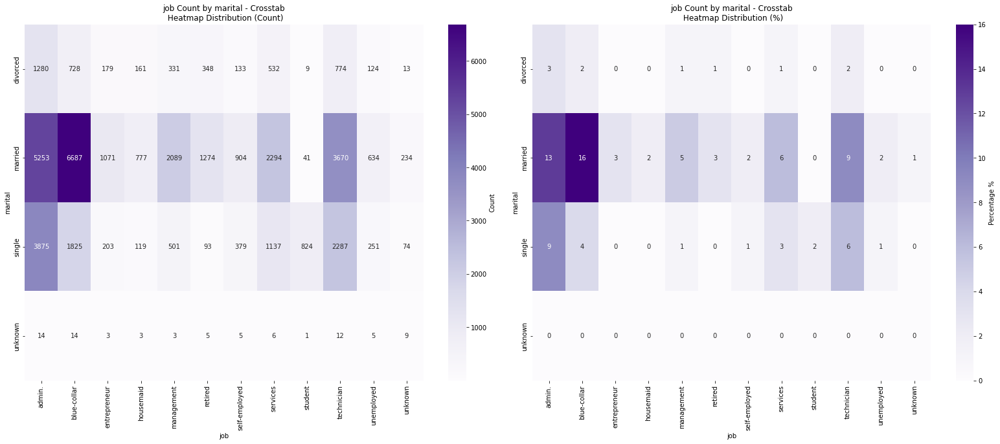

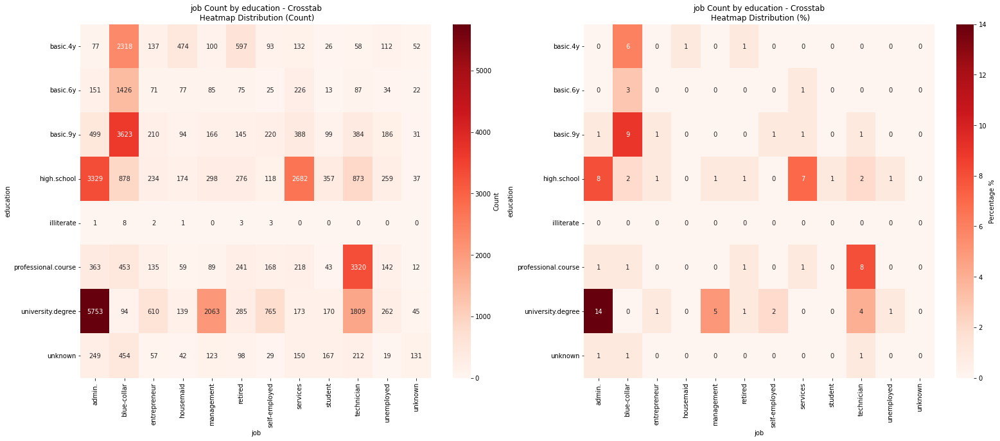

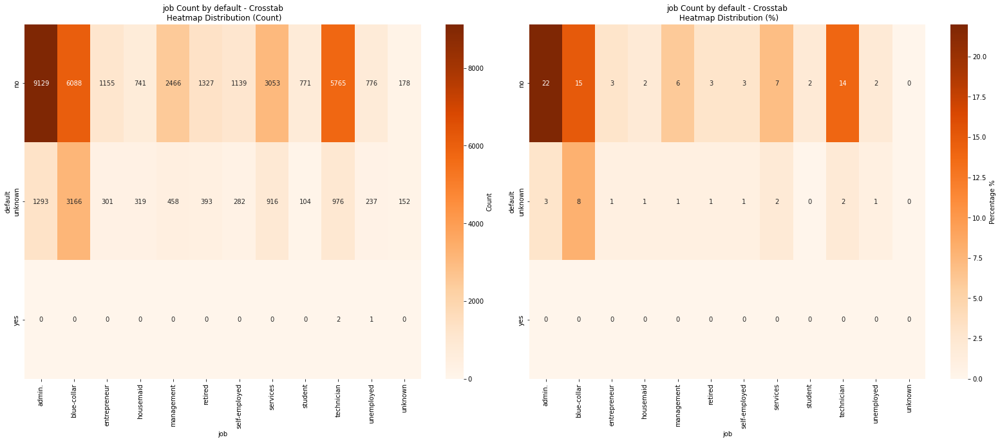

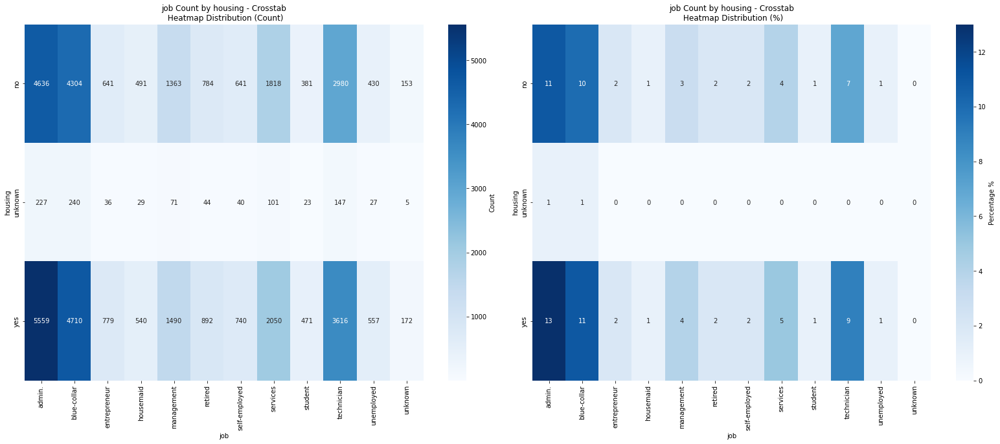

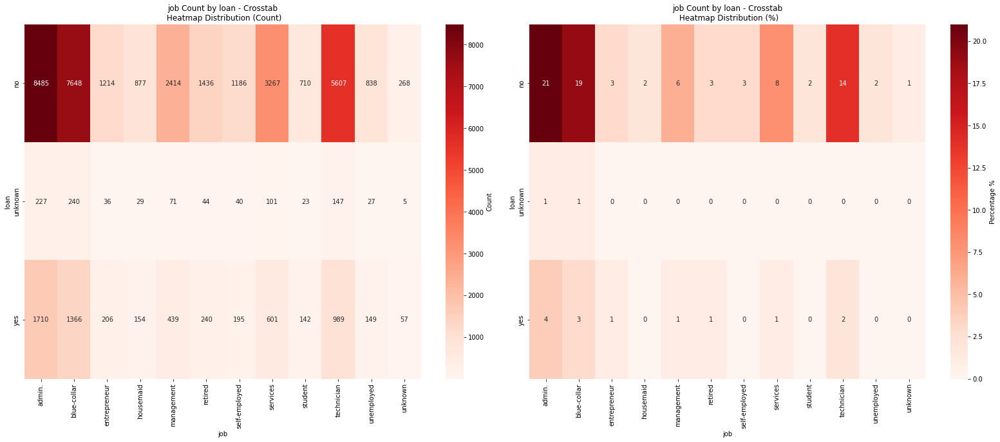

...

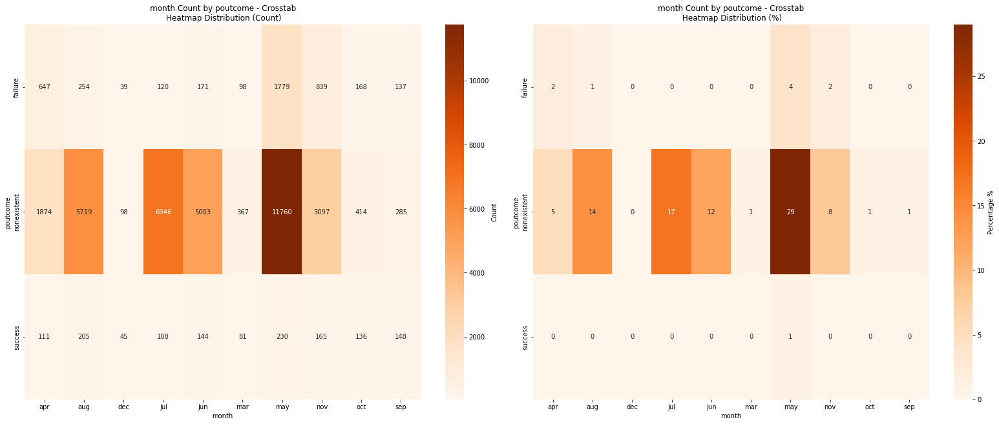

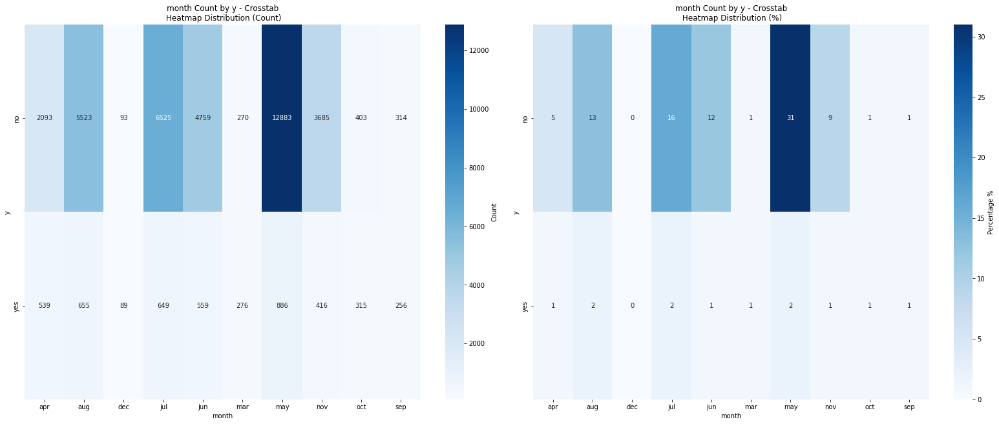

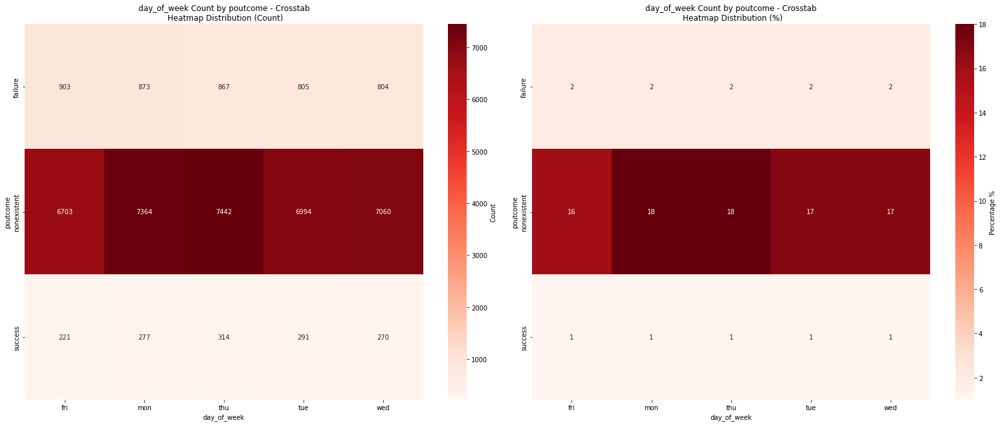

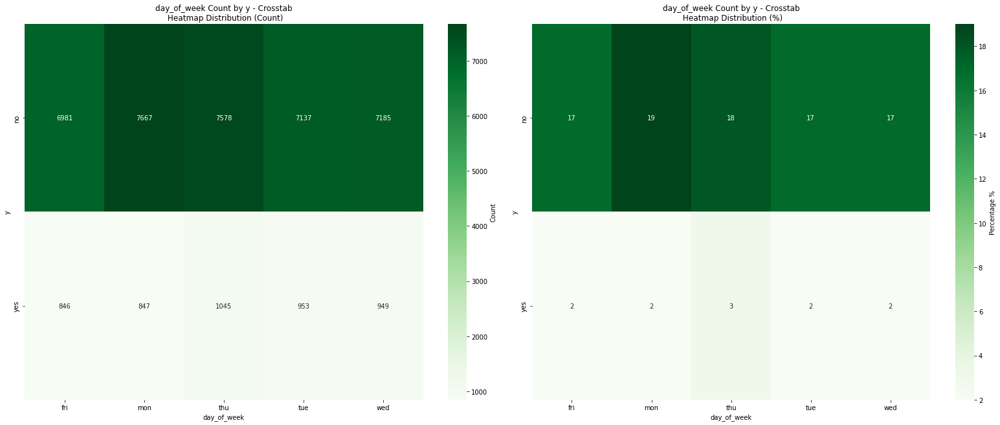

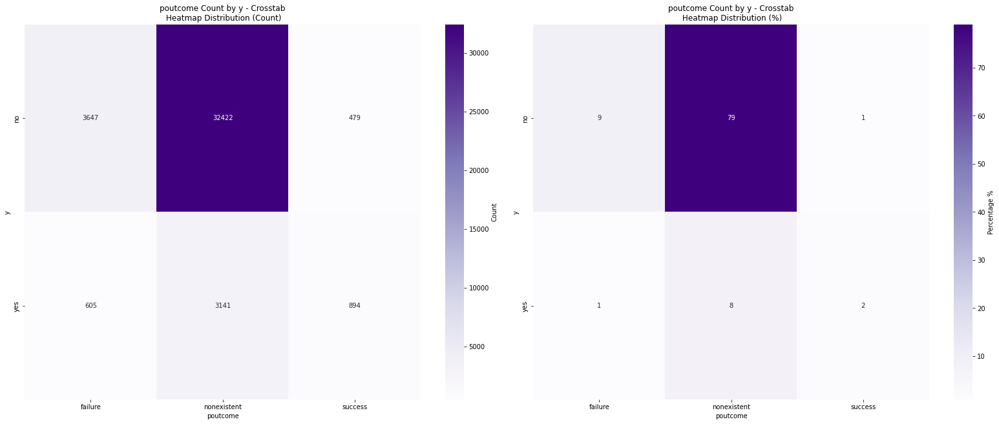

In [9]:
compare_cate_cate(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y'], df_bank)

## Categorical vs Numeric

In [16]:
def compare_cate_cont(list_cate_col, list_cont_col, df):
    for cate_col in list_cate_col:
        for cont_col in list_cont_col:
            print('*Box plot: ')
            plt.figure(figsize=(12, 10))
            sns.boxplot(x=cont_col, y=cate_col, data=df, palette="Set3")
            plt.show()

*Box plot: 


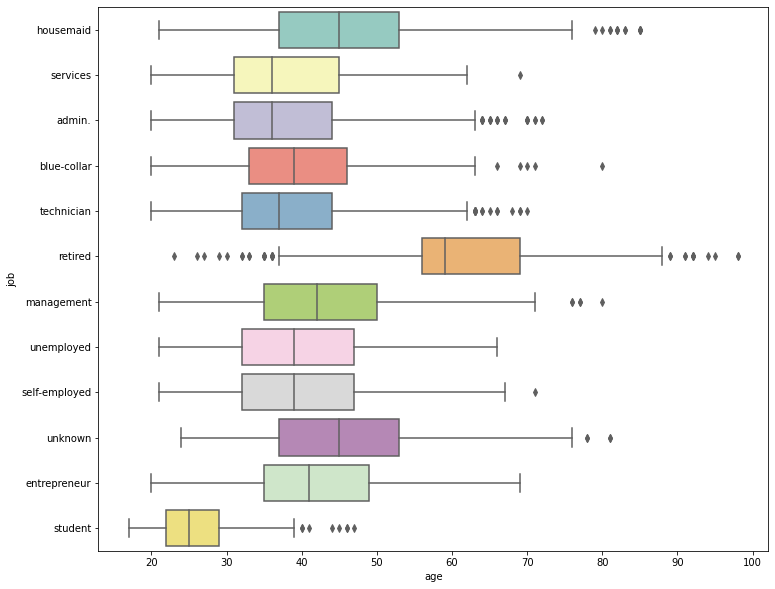

*Box plot: 


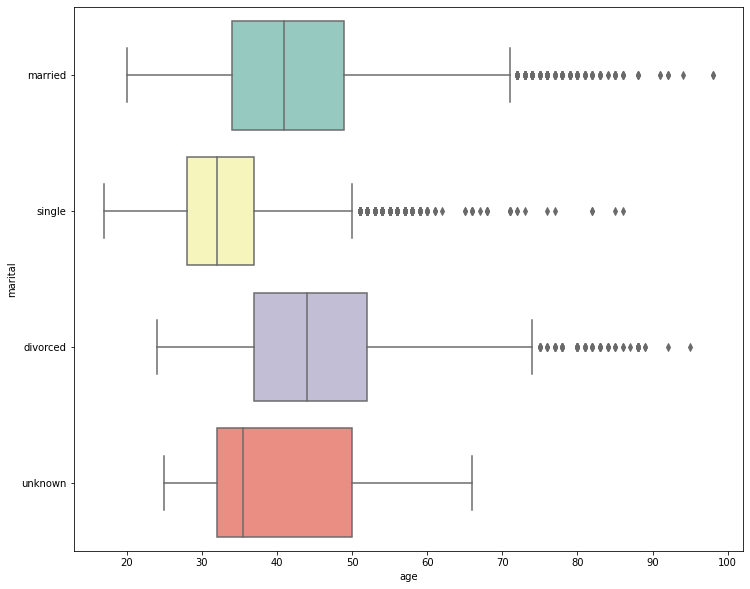

*Box plot: 


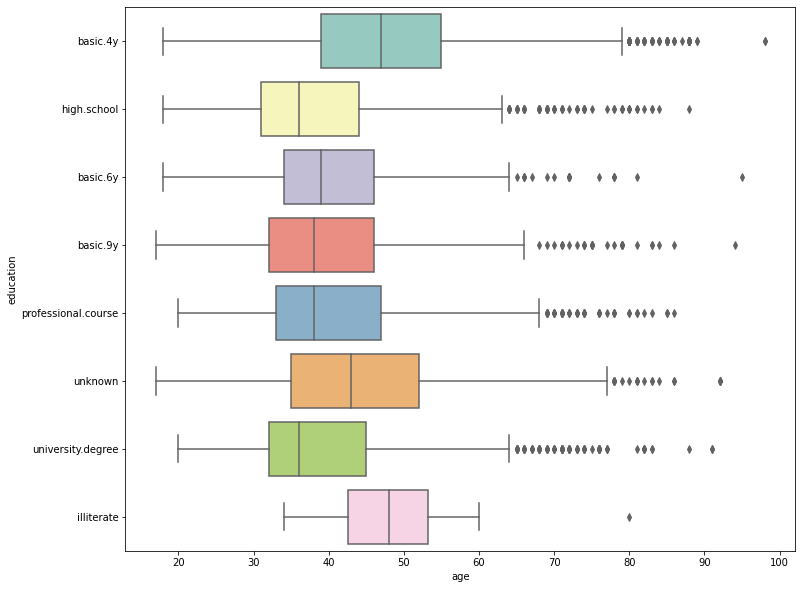

*Box plot: 


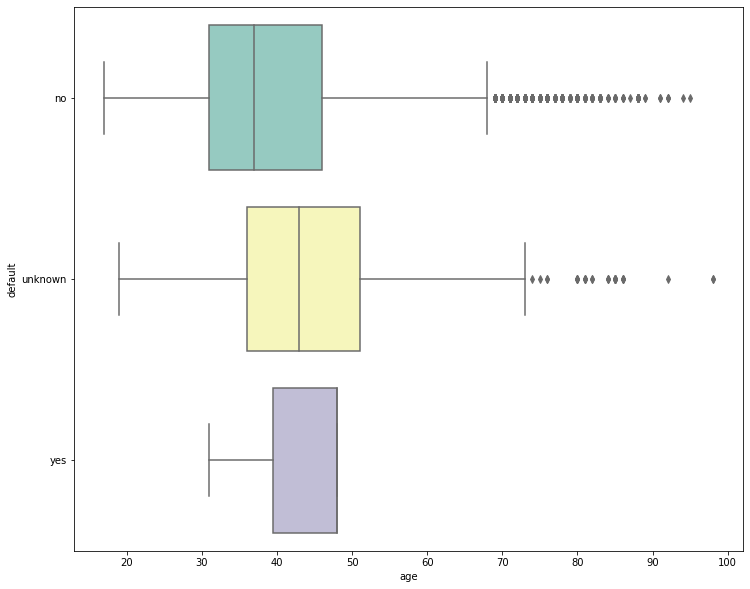

*Box plot: 


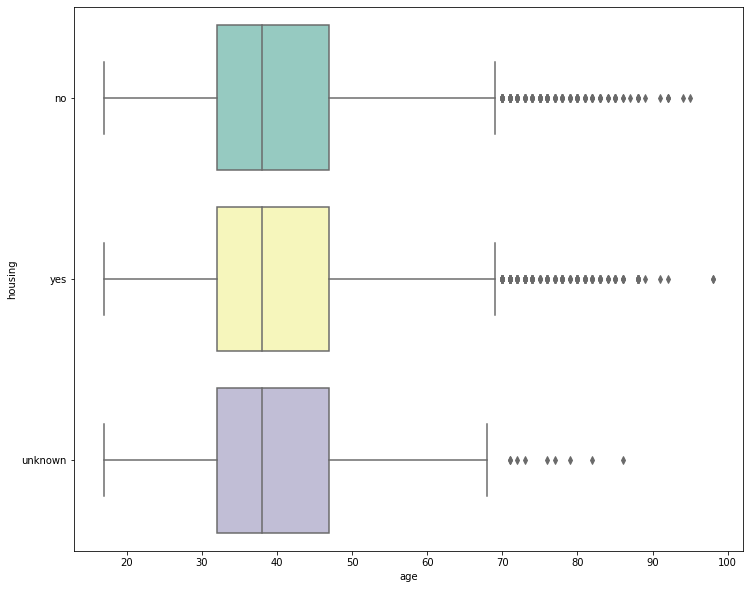

*Box plot: 


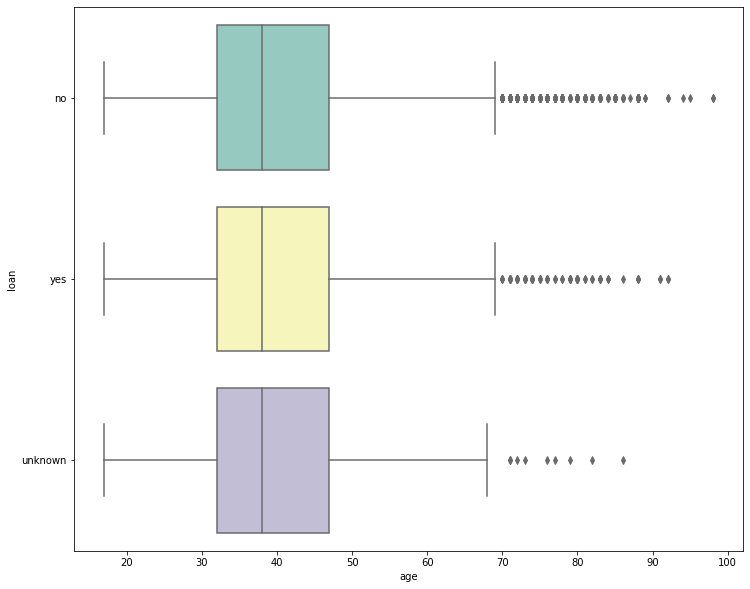

*Box plot: 


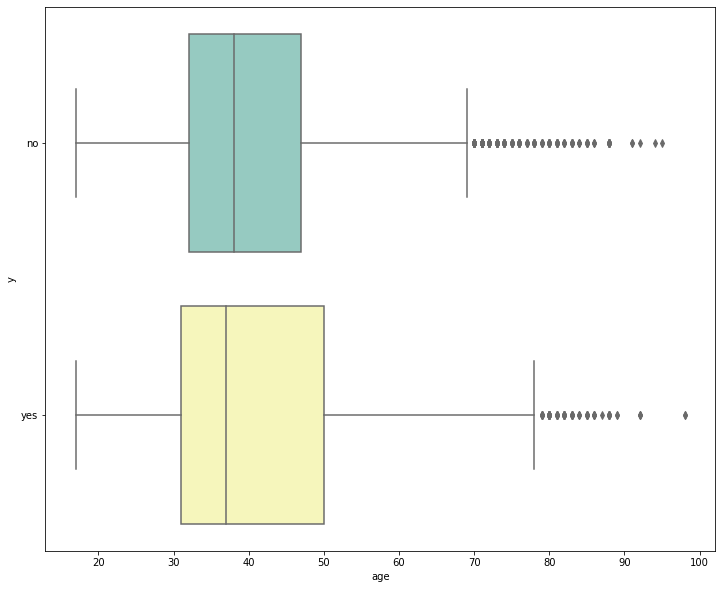

In [34]:
compare_cate_cont(['job', 'marital', 'education', 'default', 'housing', 'loan', 'y'], ['age'], df_bank)

# Feature engineering

## Age - remove outliers

In [71]:
# get age from > 1% and <99% of the quantile
q_low = df_bank["age"].quantile(0.01)
q_hi  = df_bank["age"].quantile(0.99)

df_filtered = df_bank[(df_bank["age"] < q_hi) & (df_bank["age"] > q_low)]

In [72]:
df_filtered[['age']].max()

age    70
dtype: int64

In [75]:
df_filtered[['age']].min()

age    24
dtype: int64

In [76]:
# comment: the age ranges from 24-70 after remove the outliers

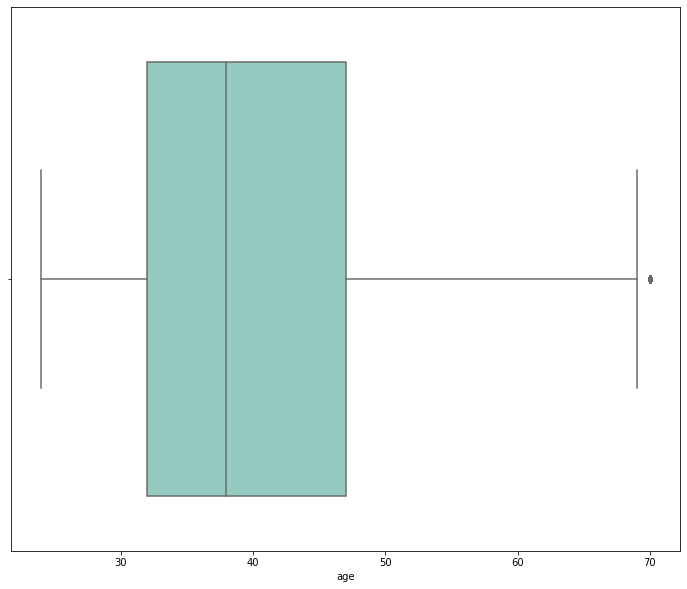

In [74]:
plt.figure(figsize=(12, 10))
sns.boxplot(x=df_filtered['age'], data=df_bank, palette="Set3")
plt.show()

## Age - binning value

In [79]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40161 entries, 0 to 41186
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             40161 non-null  int64   
 1   job             40161 non-null  object  
 2   marital         40161 non-null  object  
 3   education       40161 non-null  object  
 4   default         40161 non-null  object  
 5   housing         40161 non-null  object  
 6   loan            40161 non-null  object  
 7   contact         40161 non-null  object  
 8   month           40161 non-null  object  
 9   day_of_week     40161 non-null  object  
 10  duration        40161 non-null  int64   
 11  campaign        40161 non-null  int64   
 12  pdays           40161 non-null  int64   
 13  previous        40161 non-null  int64   
 14  poutcome        40161 non-null  object  
 15  emp.var.rate    40161 non-null  float64 
 16  cons.price.idx  40161 non-null  float64 
 17  cons.conf.id

In [78]:
bins = [24, 30, 40, 50, 60, 70]
labels = ['24-30', '31-40', '41-50', '51-60', '61-70']
df_filtered['age_binned'] = pd.cut(df_filtered['age'], bins=bins, labels=labels)
df_filtered.tail(10)

/var/folders/56/n0yfbkqj6g50_14wn04gxq2w0000gn/T/ipykernel_60212/3200050253.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['age_binned'] = pd.cut(df_filtered['age'], bins=bins, labels=labels)


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,age_binned
41176,38,housemaid,divorced,high.school,no,yes,yes,cellular,nov,thu,...,999,0,nonexistent,-1.1,94.767,-50.8,1.031,4963.6,no,31-40
41177,57,retired,married,professional.course,no,yes,no,cellular,nov,thu,...,999,0,nonexistent,-1.1,94.767,-50.8,1.031,4963.6,no,51-60
41178,62,retired,married,university.degree,no,no,no,cellular,nov,thu,...,6,3,success,-1.1,94.767,-50.8,1.031,4963.6,yes,61-70
41179,64,retired,divorced,professional.course,no,yes,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no,61-70
41180,36,admin.,married,university.degree,no,no,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no,31-40
41181,37,admin.,married,university.degree,no,yes,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes,31-40
41182,29,unemployed,single,basic.4y,no,yes,no,cellular,nov,fri,...,9,1,success,-1.1,94.767,-50.8,1.028,4963.6,no,24-30
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no,41-50
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no,51-60
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes,41-50
